# Chapter 06. 비지도 학습
## 06-1. 군집 알고리즘
Keyword: `비지도 학습`, `히스토그램`, `군집`
<br>

### 타깃을 모르는 비지도 학습
**비지도 학습(unsupervised learning)**: 타깃이 없을 때 사용하는 머신러닝 알고리즘
<br>

### 과일 사진 데이터 준비하기

In [80]:
#흑백 사진 데이터 불러오기 (넘파이 배열의 기본 저장 포맷인 npy 파일로 저장)
#데이터 다운로드
!wget http://bit.ly/fruits_300_data -O fruits_300.npy

#코드 셀에서 '!' 문자로 시작하면 명령을 파이썬 코드가 아니라 '리눅스 셸(linux shell)' 명령으로 이해함.
#wget 명령은 원격 주소에서 데이터를 다운로드하여 저장
#-O 옵션에서 저장할 파일 이름을 지정함

--2025-11-11 15:42:14--  http://bit.ly/fruits_300_data
Resolving bit.ly (bit.ly)... 67.199.248.11, 67.199.248.10
Connecting to bit.ly (bit.ly)|67.199.248.11|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/rickiepark/hg-mldl/raw/master/fruits_300.npy [following]
--2025-11-11 15:42:14--  https://github.com/rickiepark/hg-mldl/raw/master/fruits_300.npy
Resolving github.com (github.com)... 20.200.245.247
Connecting to github.com (github.com)|20.200.245.247|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rickiepark/hg-mldl/master/fruits_300.npy [following]
--2025-11-11 15:42:15--  https://raw.githubusercontent.com/rickiepark/hg-mldl/master/fruits_300.npy
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... con

In [81]:
#다운받은 파일에서 데이터 로드
#넘파이와 맷플롯립 패키지 임포트
import numpy as np
import matplotlib.pyplot as plt

In [82]:
#load()를 사용하여 npy 파일 로드
#fruits는 넘파이 배열이고, fruits_300.npy 파일에 들어있는 모든 데이터를 담고 있음
fruits = np.load('fruits_300.npy')

In [83]:
#fruits 배열 크기 확인
print(fruits.shape)

#첫 번째 차원(300): 샘플의 개수
#두 번째 차원(100): 이미지 높이
#세 번째 차원(100): 이미지 너비

(300, 100, 100)


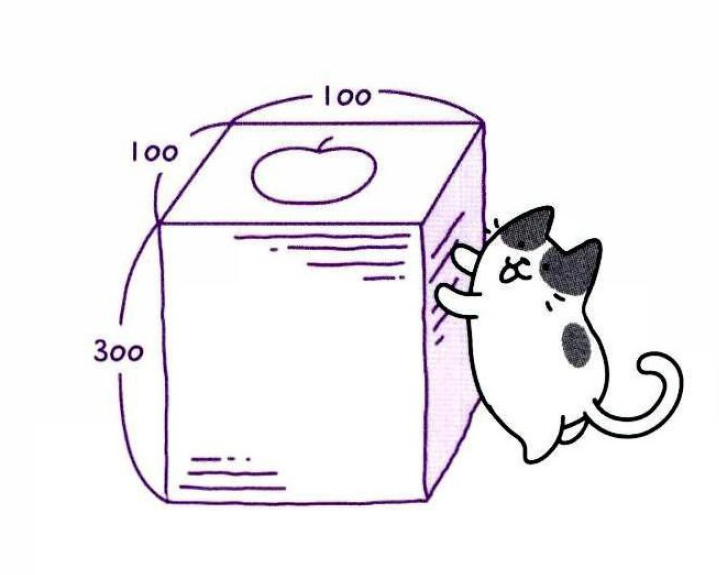

In [84]:
#첫 번째 이미지의 첫 번째 행을 출력
#3차원 배열이기 때문에 처음 2개의 인덱스를 0으로 지정하고
#마지막 인덱스는 지정하지 않거나 슬라이싱 연산자를 쓰면 첫 번째 이미지의 첫 번재 행을 모두 선택 가능
print(fruits[0, 0, :])

#첫 번째 행에 있는 픽셀 100개에 들어 있는 값을 출력함
#이 넘파이 배열은 흑백 사진을 담고 있으므로 '0~255'까지의 정숫값을 가짐

[  1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   2   1
   2   2   2   2   2   2   1   1   1   1   1   1   1   1   2   3   2   1
   2   1   1   1   1   2   1   3   2   1   3   1   4   1   2   5   5   5
  19 148 192 117  28   1   1   2   1   4   1   1   3   1   1   1   1   1
   2   2   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1
   1   1   1   1   1   1   1   1   1   1]


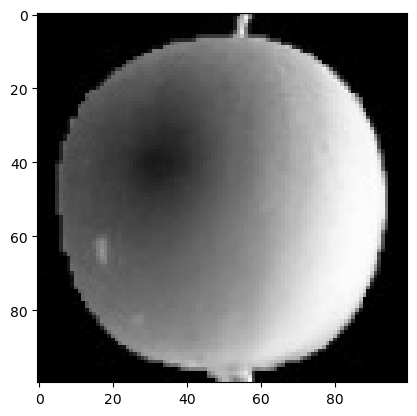

In [85]:
#첫 번째 이미지를 그림으로 그려서 위의 숫자와 비교
#맷플롯립의 imshow() 함수를 사용하면 넘파이 배열로 저장된 이미지를 쉽게 그릴 수 있음
#흑백 이미지이므로 cmap 매개변수를 'gray'로 지정
plt.imshow(fruits[0], cmap='gray')
plt.show()

- 다음의 그림처럼 첫 번째 행이 위에서 출력한 배열 값에 대항
- 0에 가까울수록 검게 나타나고 높은 값은 밝게 표시됨
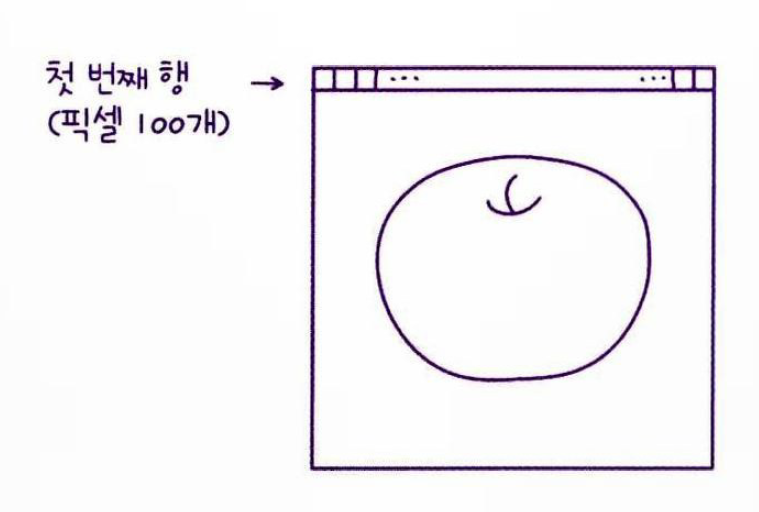

- 보통 흑백 샘플 이미지는 바탕이 밝고 물체(사과)가 짙은 색
- 위의 흑백 이미지는 사진으로 찍은 이미지를 넘파이 배열로 변환할 때 반적시킨 것
- 사진의 흰 바탕(높은 값)은 검은색(낮은 값)으로 만들고 실제 사과가 있어 짙은 부분(낮은 값)은 밝은색(높은 값)으로 바꿈
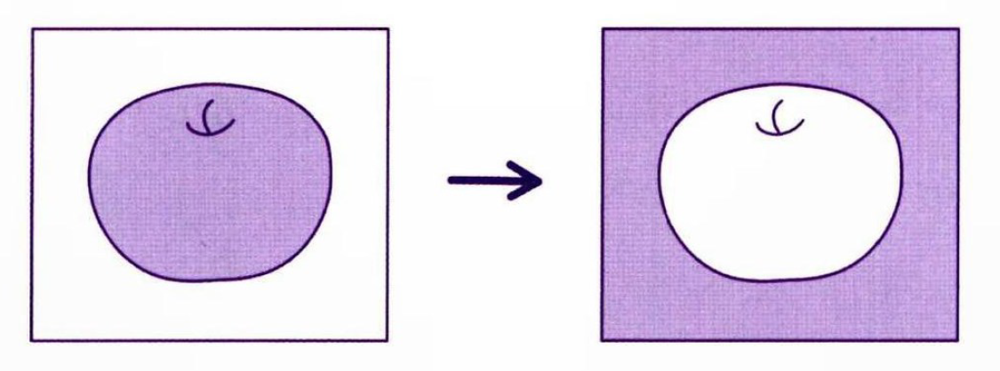

- 흰색 바탕은 우리에게 중요하지 않지만 컴퓨터는 255에 가까운 바탕에 집중
- 따라서 바탕을 검게 만들고 사진에 짙게 나온 사과를 밝은색으로 만듦
<br>

- 컴퓨터는 왜 255에 가까운 바탕에 집중하나요?
    - 알고리즘이 어떤 출력을 만들기 위해 곱셈, 덧셈을 함. 픽셀값이 0이면 출력도 0이 되어 의미가 없음. 픽셀값이 높으면 출력값도 커지기 때문에 의미를 부여하기 좋음

- 컴퓨터가 처리하는 방식이 다르기 때문에 종종 흑백 이미지를 반전하여 사용
- 관심 대상의 영역을 높은 값으로 바꾸었지만 맷플롯립으로 출력할 때 바탕이 검게 나오므로
- `cmap` 매개변수를 `gray_r`로 지정하면 다시 반전하여 사용자 눈에 보기 좋게 출력

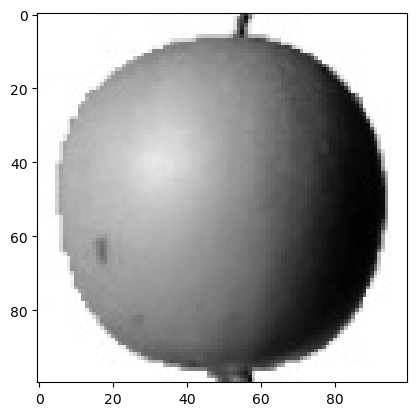

In [86]:
plt.imshow(fruits[0], cmap='gray_r')
plt.show()

- 그림에서 밝은 부분이 0에 가깝고, 짙은 부분이 255에 가까운 값

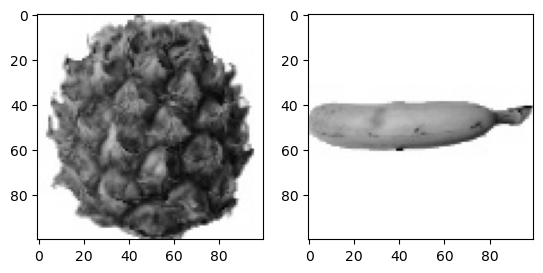

In [87]:
#사과, 바나나, 파인애들이 각각 100개식 데이터에 포함되어 있음
#바나나와 파인애들 이미지도 출력
fig, axs = plt.subplots(1, 2)
axs[0].imshow(fruits[100], cmap='gray_r')
axs[1].imshow(fruits[200], cmap='gray_r')
plt.show()

- 맷플롯립의 `subplot()`함수를 사용하면 여러 개의 그래프를 배열처럼 쌓을 수 있게 함
- `subplot()`함수의 두 매개변수는 그래프를 쌓을 행과 열을 지정
    - 여기에서는 `subplots(1, 2)`처럼 하나의 행과 2개의 열을 지정 => `subplots(row, column)`
- 반환된 `axs`는 2개의 서브 그래프를 담고 있는 배열
    - `axs[0]`에 파인애플 이미지를, `axs[1]`에 바나나 이미지를 그림
- `subplots()`를 사용해 한 번에 여러 개의 이미지를 그려봄

### 픽셀값 분석하기
- 사용하기 쉽게 fruits 데이터를 사과, 파인애플, 바나나로 각각 나누기
- 넘파이 배열을 나눌 때 100 x 100 이미지를 펼쳐서 길이가 10,000개인 1차원 배열로 변환
- 이렇게 펼치면 이미지로 출력하긴 어렵지만 배열을 계산할 때 편리
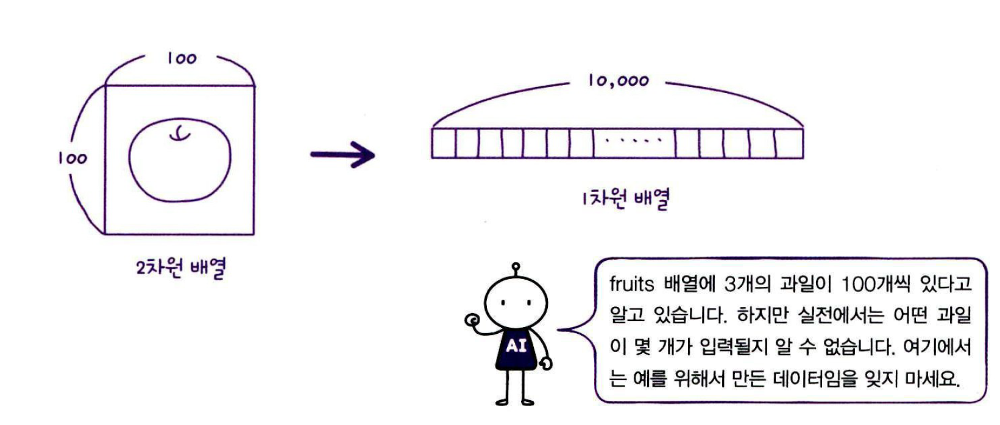
- fruits 배열에서 순서대로 100개씩 선택하기 위해 **슬라이싱 연산자**를 사용  
    그다음 `reshape()`메서드를 사용해 두 번재 차원(100)과 세 번째 차원(100)을 10,000으로 합침
    첫 번재 차원을 **-1**로 지정하면 자동으로 남은 차원을 할당
    여기에서는 첫 번째 차원이 샘플 개수

In [88]:
apple = fruits[0:100].reshape(-1, 100*100)
pineapple = fruits[100:200].reshape(-1, 100*100)
banana = fruits[200:300].reshape(-1, 100*100)
#apple, pineapple, banana 배열의 크기는 (100, 10000)임
#사과 확인
print(apple.shape)

(100, 10000)


- apple, pineapple, banana 배열에 들어 있는 샘플의 픽셀 평균값 계산
- 넘파이 `mean()`메서드를 사용
- **샘플마다 픽셀의 평균값을 계산**해야 하므로 `mean()`메서드가 평균을 계산할 축을 지정
- `axis=0`으로 하면 첫 번째 축인 행을 따라 계산
- `axis=1`로 지정하면 두 번째 축인 열을 따라 계산
<br>

- `axis`인수가 뭔가요?
    - `axis`는 배열의 **'축'**을 의미. 
    - 다음의 apple 2차원 배열에서 `axis=1`일 때는 열 방향으로 계산하고, 
    - `axis = 0`일 때는 행 방향으로 계산
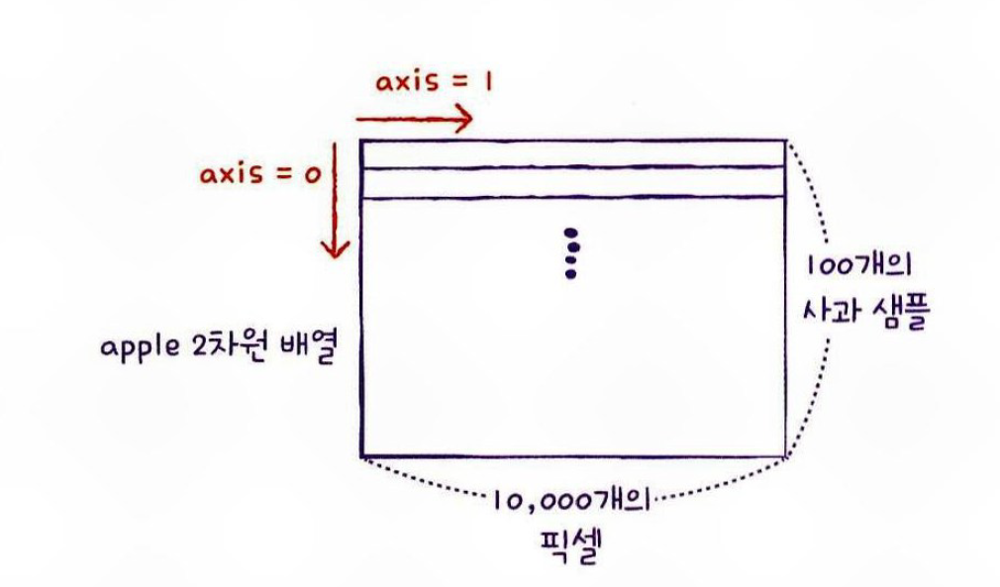
<br>

- 현재 필요한 것은 **각 샘플의 평균값**
- 샘플의 값은 가로로 나열되어있으니 `axis=1`로 지정하여 평균 계산
- 평균을 계산하는 넘파이 `np.mean()`함수를 사용해도 되지만, 넘파이 배열은 이런 함수들을 메서드로 제공
- apple 배열의 `mean()`메서드로 각 샘플의 픽셀 평균값 계산

In [89]:
print(apple.mean(axis=1))
#사과 샘플 100개에 대한 픽셀 평균값을 계산
#히스토그램(histogram)을 그려보면 평균값이 어떻게 분포되어 있는지 확인 가능

[ 88.3346  97.9249  87.3709  98.3703  92.8705  82.6439  94.4244  95.5999
  90.681   81.6226  87.0578  95.0745  93.8416  87.017   97.5078  87.2019
  88.9827 100.9158  92.7823 100.9184 104.9854  88.674   99.5643  97.2495
  94.1179  92.1935  95.1671  93.3322 102.8967  94.6695  90.5285  89.0744
  97.7641  97.2938 100.7564  90.5236 100.2542  85.8452  96.4615  97.1492
  90.711  102.3193  87.1629  89.8751  86.7327  86.3991  95.2865  89.1709
  96.8163  91.6604  96.1065  99.6829  94.9718  87.4812  89.2596  89.5268
  93.799   97.3983  87.151   97.825  103.22    94.4239  83.6657  83.5159
 102.8453  87.0379  91.2742 100.4848  93.8388  90.8568  97.4616  97.5022
  82.446   87.1789  96.9206  90.3135  90.565   97.6538  98.0919  93.6252
  87.3867  84.7073  89.1135  86.7646  88.7301  86.643   96.7323  97.2604
  81.9424  87.1687  97.2066  83.4712  95.9781  91.8096  98.4086 100.7823
 101.556  100.7027  91.6098  88.8976]


- **히스토그램(histogram)**이 뭔가요? -- 막대그래프
    - 히스토그램은 값이 발생한 빈도를 그래프로 표시한 것
    - 보통 `x축`이 **값의 구간(계급)**
    - `y축`은 **발생 빈도(도수)**임

- 맷플롯립의 hist() 함수를 사용해 히스토그램 생성
- 사과, 파인애플, 바나나에 대한 히스토그램을 겹쳐 그리겠음
- 투명하게 해야 겹친 부분을 잘 볼 수 있기 때문에
    `alpha` 매개변수를 1보다 작게 하면 투명도를 줄 수 있음
- 맷플롯립의 `legend()`함수를 사용해 어떤 과일의 히스토그램인지 범례를 생성

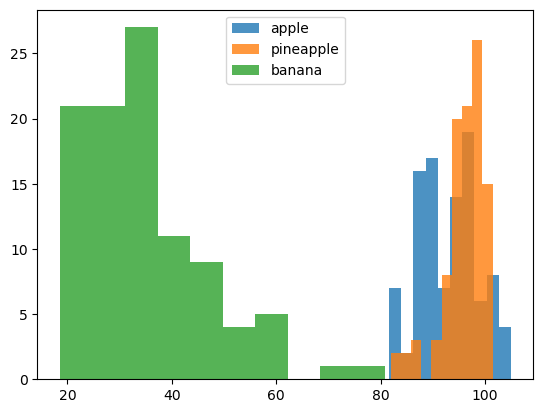

In [90]:
plt.hist(apple.mean(axis=1), alpha=0.8, label='apple')
plt.hist(pineapple.mean(axis=1), alpha=0.8, label='pineapple')
plt.hist(banana.mean(axis=1), alpha=0.8, label='banana')
plt.legend()
plt.show()

- 히스토그램에서
    - 바나나 사진의 평균값은 40 아래에 집중
    - 사과와 파인애플은 90~100 사이에 많이 모여있음
    - 바나나는 픽셀 평균값만으로 사과나 파인애플과 확실히 구분
    - 바나나는 사진에서 차지하는 영역이 작기 때문에 평균값이 작음
<br>

- 사과와 파인애플은 많이 겹쳐있어서 픽셀값만으로는 구분하기 어려움
    - 사과나 파인애플은 대체로 형태가 동그랗고 사진에서 차지하는 크기도 비슷하기 때문
<br>

- 샘플의 평균값이 아닌 픽셀별 평균값을 비교
    - 전체 샘플에 대해 각 픽셀의 평균을 계산
    - 세 과일은 모양이 다르므로 픽셀값이 높은 위치가 다를 것으로 예상
<br>

- 픽셀의 평균 계산
    - `axis = 0`으로 지정
<br>

- 맷플롯립의 `bar()`함수를 사용해 픽셀 10,000개에 대한 평균값을 막대그래프로 표현
- `subplots()`함수로 3개의 서브 그래프를 만들어 사과, 파인애플, 바나나에 대한 막대그래프 생성

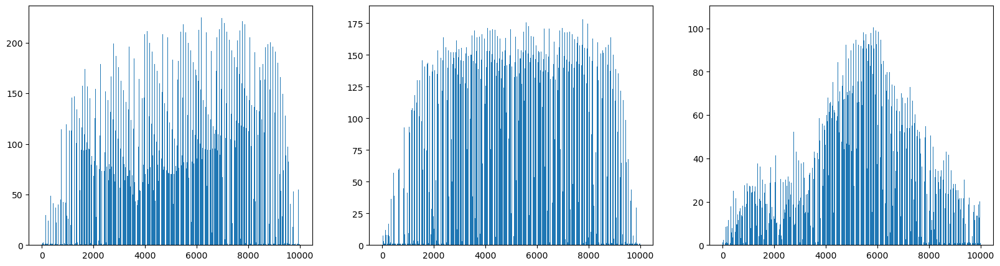

In [91]:
fig, axs = plt.subplots(1, 3, figsize=(20, 5))
axs[0].bar(range(10000), apple.mean(axis=0))
axs[1].bar(range(10000), pineapple.mean(axis=0))
axs[2].bar(range(10000), banana.mean(axis=0))
plt.show()

- 순서대로 사과, 파인애플, 바나나 그래프
- 3개의 그래프를 보면 과일마다 값이 높은 구간이 다름
    - 사과는 사진 중앙에 상대적으로 값이 작은 영역이 보이고
    - 파인애플 그래프는 비교적 고르면서 높음
    - 바나나는 확실히 중앙의 픽셀값이 높음
<br>

- 픽셀 평균값을 100x100 크기로 바꿔서 이미지처럼 출력하여 위 그래프와 비교하면 좋음
- 픽셀을 평균 낸 이미지를 모든 사진을 합쳐 놓은 대표 이미지로 생각 가능

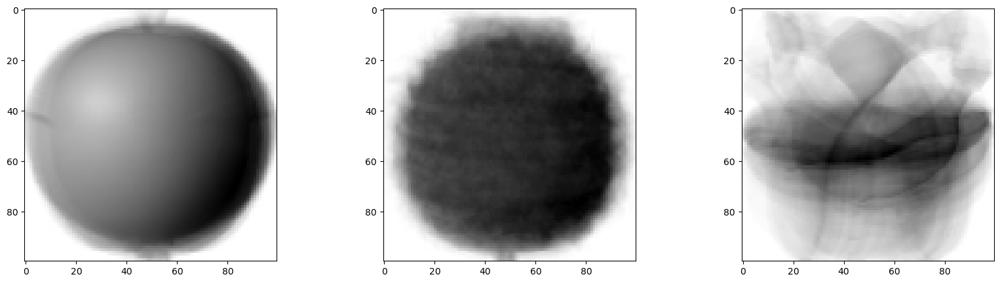

In [92]:
apple_mean = apple.mean(axis=0).reshape(100, 100)
pineapple_mean = pineapple.mean(axis=0).reshape(100, 100)
banana_mean = banana.mean(axis=0).reshape(100, 100)
fig, axs = plt.subplots(1, 3, figsize=(20,5))
axs[0].imshow(apple_mean, cmap='gray_r')
axs[1].imshow(pineapple_mean, cmap='gray_r')
axs[2].imshow(banana_mean, cmap='gray_r')
plt.show()

- 세 과일은 픽셀 위치에 따라 값의 크기가 차이 남
- 따라서 이 대표 이미지와 가까운 사진을 골라낸다면 사과, 파인애플, 바나나를 구분할 수 있을 것이라 예상
<br>

### 평균값과 가까운 사진 고르기
- **절댓값 오차**를 사용하여 사과 사진의 평균값인 `apple_mean`과 가장 가까운 사진을 골라보기
    - `fruits` 배열에 있는 모든 샘플에서 `apple_mean`을 뺀 절댓값의 평균을 계산
- 넘파이 `abs()`함수: 절댓값을 계산하는 함수
    - 예) `np.abs(-1)` = 1
    - 배열을 입력하면 **모든 원소의 절댓값**을 계산 -> **입력과 동일한 크기의 배열**을 반환
    - 이 함수는 `np.absolute()`함수의 다른 이름
<br>

- 아래의 코드에서 `abs_diff`는 (300, 100, 100) 크기의 배열
    - 따라서 각 샘플에 대한 평균을 구하기 위해 axis에 두 번째, 세 번째 차원을 모두 지정
    - 이렇게 계산한 `abs_mean`은 각 샘플의 오차 평균이므로 크기가 `(300,)`인 **1차원 배열**

In [93]:
abs_diff = np.abs(fruits - apple_mean)
abs_mean = np.mean(abs_diff, axis=(1,2))
print(abs_mean.shape)

(300,)


- 그다음, 값이 가장 작은 순서대로 100개를 추출
- 즉, apple_mean과 오차가 가장 작은 샘플 100개를 추출
- `np.argsort()`함수: 작은 것에서 큰 순서대로 나열한 `abs_mean`배열의 인덱스를 반환
- 이 인덱스 중에서 처음 100개를 선택해 10x10 격자로 이루어진 그래프 생성

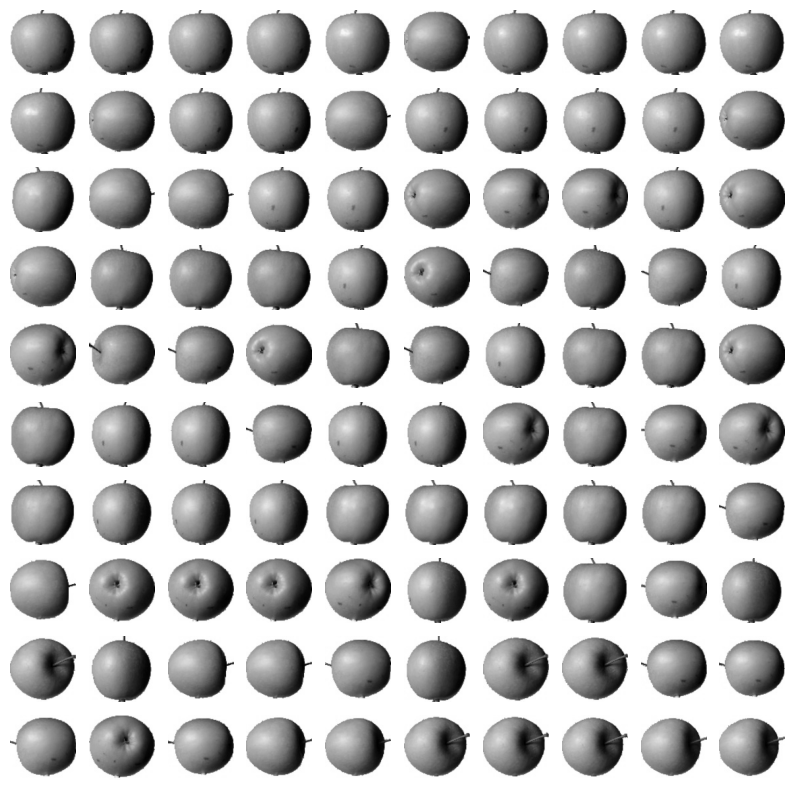

In [94]:
apple_index = np.argsort(abs_mean)[:100]
apple_index = apple_index.reshape(10, 10)
fig, axs = plt.subplots(10, 10, figsize=(10, 10))
for i in range(10):
    for j in range(10):
        axs[i, j].imshow(fruits[apple_index[i, j]], cmap='gray_r')
        axs[i, j].axis('off')
plt.show()

- `apple_mean`과 가장 가까운 사진 100개를 골랐더니 모두 사과 출력
<br>

- `subplot()`함수로 10x10, 총 100개의 서브 그래프를 생성
    - 그래프가 많기 때문에 전체 그래프 크기를 `figsize=(10, 10)`으로 조금 크게 지정
- 2중 `for`반복문을 순회하면서 10개의 행과 열에 이미지를 출력
- axs는 (10, 10) 크기의 2차원 배열이므로 i, j 두 첨자를 사용하여 서브 그래프의 위치를 지정
- `axis('off')`를 사용하여 좌표축을 그리지 않음
- 좌표축을 그리고 싶다면 'on'으로 변경하거나 해당 즐을 삭제하고 그림 생성하면 됨
<br>

- *맷플롯립의 figsize 기본값은 (8, 6)*
<br>

- 흑백 사진에 있는 픽셀값을 사용하여 과일 사진을 모으는 작업을 진행함
- **군집(clustering)**: 비슷한 샘플끼리 그룹으로 모으는 작업, 대표적인 비지도 학습 작업 중 하나
- **클러스터(cluster)**: 군집 알고리즘에서 만든 그룹
<br>

- 타깃값을 알고 있었기 때문에 사과, 파인애플, 바나나의 사진 평균값을 계산해서 가장 가까운 과일을 찾을 수 있었음
- 실제 비지도 학습에서는 타깃값을 모르기 때문에 이처럼 샘플의 평균값을 미리 구할 수 있음

## 06-2. k-평균
Keyword: `k-평균`, `클러스터 중심`, `엘보우 방법`
<br>

- 06-1절에서는 사과, 파인애플, 바나나 사진임을 미리 알고 있었기 때문에 각 과일의 평균을 구할 수 있었음
- 하지만 진짜 비지도 학습에서는 사진에 어떤 과일이 들어있는지 모름
- 이런 경우, **k-평균(k-means)** 군집 알고리즘으로 평균값을 자동 추출
    - 이 평균값이 클러스터의 *중심*에 위치하기 때문에 **클러스터 중심(cluster center)** 또는 **센트로이드(centroid)**라고 부름
<br>

### k-평균 알고리즘 소개
- k-평균 알고리즘의 작동방식
    1. 무작위로 k개의 클러스터 중심을 설정
    2. 각 샘플에서 가장 가까운 클러스터 중심을 찾아 해당 클러스터의 샘플로 지정
    3. 클러스터에 속한 샘플의 평균값으로 클러스터 중심을 변경
    4. 클러스터 중심에 변화가 없을 때까지 2번으로 돌아가 반복
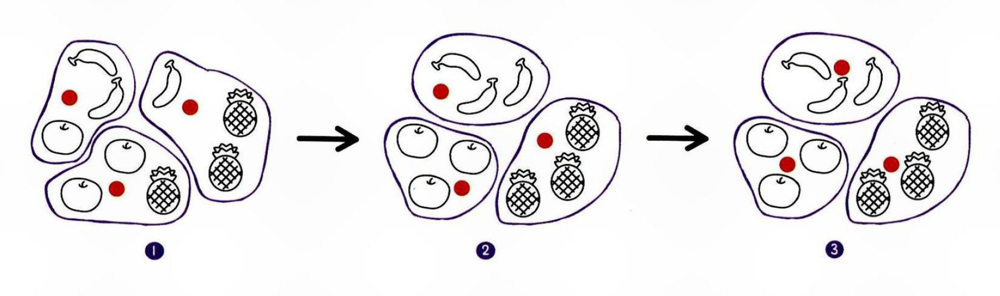
(1) 먼저 3개의 클러스터 중심(빨간 점)을 랜덤하게 지정. 클러스터 중심에서 가장 가까운 샘플을 하나의 클러스터로 묶음
    왼쪽 위부터 시계 방향으로 바나나 2개와 사과 1개 클러스터, 바나나 1개와 파인애플 2개 클러스터, 사과 2개와 파인애플 1개 클러스터가 만들어짐
    클러스터의 중심을 다시 계산하여 이동. 맨 아래 클러스터는 사과 쪽으로 중심이 이동, 왼쪽 위 클러스터는 바나나 쪽으로 중심 이동
(2) 클러스터의 중심을 다시 계산한 다음 가장 가까운 샘플을 다시 클러스터로 묶음
    이제 3개의 클러스터에는 바나나와 파인애플, 사과가 3개씩 묶여짐
    다시 한번 클러스터 중심을 계산
    빨간 점을 클러스터의 가운데 부분으로 이동
(3) 이동된 클러스터 중심에서 다시 한번 가장 가까운 샘플을 클러스터로 묶음
    중심에서 가장 가까운 샘플은 이전 클러스터(2)와 동일
    따라서 만들어진 클러스터에 변동이 없으므로 k-평균 알고리즘을 종료
<br>

- k-평균 알고리즘은 처음에는 랜덤하게 클러스터 중심을 선택하고 점차 가장 가까운 샘플의 중심으로 이동하는 비교적 간단한 알고리즘
<br>

### KMeans 클래스


In [95]:
#wget명령으로 데이터를 다운로드
!wget http://bit.ly/fruits_300_data -O fruits_300.npy

--2025-11-11 15:42:36--  http://bit.ly/fruits_300_data
Resolving bit.ly (bit.ly)... 67.199.248.10, 67.199.248.11
Connecting to bit.ly (bit.ly)|67.199.248.10|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/rickiepark/hg-mldl/raw/master/fruits_300.npy [following]
--2025-11-11 15:42:37--  https://github.com/rickiepark/hg-mldl/raw/master/fruits_300.npy
Resolving github.com (github.com)... 20.200.245.247
Connecting to github.com (github.com)|20.200.245.247|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rickiepark/hg-mldl/master/fruits_300.npy [following]
--2025-11-11 15:42:37--  https://raw.githubusercontent.com/rickiepark/hg-mldl/master/fruits_300.npy
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.111.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... con

In [96]:
#넘파이 np.load() 함수를 사용해 npy 파일을 읽어 넘파이 배열 준비
#k-평균 모델을 훈련하기 위해 (샘플 개수, 너비, 높이) 크기의 3차원 배열을 (샘플 개수, 너비X높이) 크기를 가진 2차원 배열로 변경
import numpy as np
fruits = np.load('fruits_300.npy')
fruits_2d = fruits.reshape(-1, 100*100)

In [97]:
#사이킷런의 k-평균 알고리즘은 sklearn.cluster 모듈 아래 KMeans 클래스에 구현
#이 클래스에서 설정할 매개변수는 클러스터 개수를 지정하는 n_clusters
#여기에서는 클러스터 개수를 3으로 지정
#이 클래스에서 사용하는 방법도 다른 클래스와 비슷하나, 비지도 학습이므로 fit() 메서드에 타깃 데이터는 사용하지 않음
from sklearn.cluster import KMeans
km = KMeans(n_clusters=3, random_state=42)
km.fit(fruits_2d)

,n_clusters,3
,init,'k-means++'
,n_init,'auto'
,max_iter,300
,tol,0.0001
,verbose,0
,random_state,42
,copy_x,True
,algorithm,'lloyd'


In [98]:
#군집된 결과는 KMeans 클래스 객체의 labels_ 속성에 저장
#labels_ 배열의 길이는 샘플 개수와 같음
#이 배열은 각 샘플이 어떤 레이블에 해당되는지 나타냄
#n_cluster=3으로 지정했기 때문에 labels_ 배열의 값은 0, 1, 2 중 하나임
print(km.labels_)

[2 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2 2 2 0 2 2 2 2 2 2 2 0 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 0 2 0 2 2 2 2 2 2 2 0 2 2 2 2 2 2 2 2 2 0 0 2 2 2 2 2 2 2 2 0 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 0 2 2 2 2 2 2 2 2 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 0 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1
 1 1 1 1]


In [99]:
#레이블값 0, 1, 2와 레이블 순서에는 어떤 의미도 없음
#실제 레이블 0, 1, 2가 어떤 과일 사진을 주로 모았는지 알아보려면 직접 이미지를 출력하는 것이 최선
#우선 레이블 0, 1, 2로 모은 샘플의 개수를 확인
print(np.unique(km.labels_, return_counts=True))

#첫 번째 클러스터(레이블0)가 112개의 샘플
#두 번째 클러스터(레이블1)가 98개의 샘플
#세 번째 클러스터(레이블2)가 90개의 샘플을 수집

(array([0, 1, 2], dtype=int32), array([112,  98,  90]))


In [100]:
#각 클러스터가 어떤 이미지를 나타냈는지 그림으로 출력하기 위해 유틸리티 함수 draw_fruits()를 생성
import matplotlib.pyplot as plt
def draw_fruits(arr, ratio=1):
    n = len(arr) # n = 샘플개수
    #한 줄에 10개씩 이미지를 생성. 샘플 개수를 10으로 나누어 전체 행 개수를 계산
    rows = int(np.ceil(n/10))
    #행이 1개이면 열의 개수는 샘플 개수. 그렇지 않으면 10개임
    cols = n if rows <2 else 10
    fig, axs = plt.subplots(rows, cols,
                            figsize=(cols*ratio, rows*ratio), squeeze=False)
    for i in range(rows):
        for j in range(cols):
            if i*10 + j < n: # n 개까지만 그림
                axs[i, j].imshow(arr[i*10+j], cmap='gray_r')
            axs[i, j].axis('off')
    plt.show()

- `draw_fruits()`함수는 (샘플 개수, 너비, 높이)의 3차원 배열을 입력받아 가로로 10개씩 이미지 출력
- 샘플 개수에 따라 행과 열의 개수를 계산하고 figsize를 지정
- figsize는 `ratio` 매개변수에 비례하여 커짐
- `ratio`의 기본값은 1
<br>

- 그다음 2중 for 반복문을 사용하여 먼저 첫 번째 행을 따라 이미지를 생성
- 그리고 두 번째 행의 이미지를 그리는 식으로 계속됨
<br>

- 이 함수를 사용해 레입르이 0인 과일 사진을 모두 생성
- `km.labels_==0`과 같이 쓰면 `km.labels_` 배열에서 값이 0인 위치는 `True`, 그 외는 모두 `False`가 됨
- 넘파이는 이런 **불리언** 배열을 사용해 원소를 선택 가능 = **불리언 인덱싱**
- 넘파이 배열에 불리언 인덱싱을 적용하면 `True`인 위치의 원소만 모두 추출

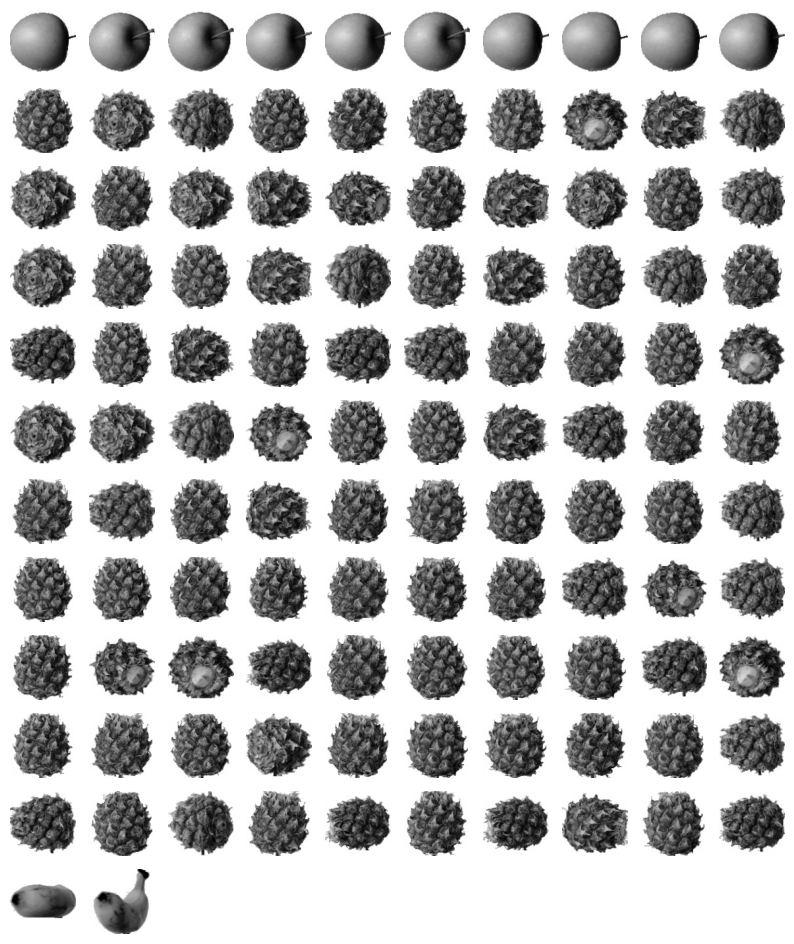

In [101]:
#레이블 0으로 클러스터링된 92개의 이미지를 모두 출력
draw_fruits(fruits[km.labels_==0])

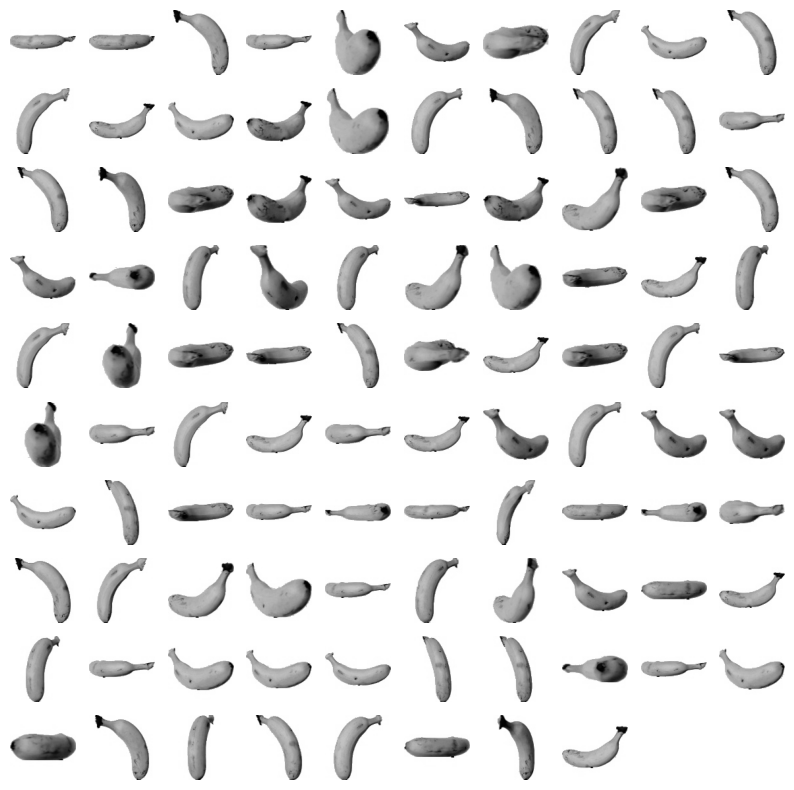

In [102]:
#레이블 1으로 클러스터링된 이미지를 모두 출력
draw_fruits(fruits[km.labels_==1])

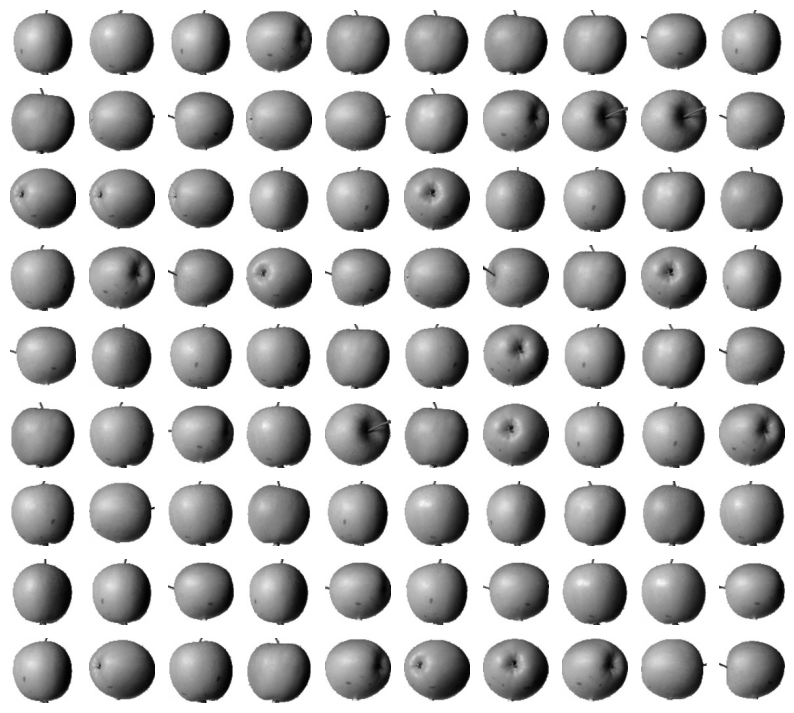

In [103]:
#레이블 2으로 클러스터링된 이미지를 모두 출력
draw_fruits(fruits[km.labels_==2])

### 클러스터 중심
- KMeans 클래스가 최종적으로 찾은 클러스터 중심은 `cluster_centers_`속성에 저장되어 있음
- 이 배열은 `fruits_2d` 샘플의 클러스터 중심이기 때문에 각 중심을 이미지로 출력하려면 100X100 크기의 2차원 배열로 전환

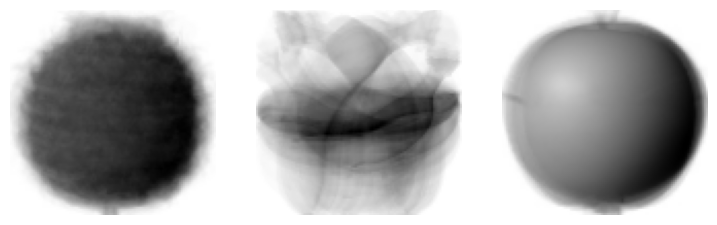

In [104]:
draw_fruits(km.cluster_centers_.reshape(-1, 100, 100), ratio=3)

- `KMeans` 클래스는 훈련 데이터 샘플에서 클러스터 중심까지 거리로 변환해 주는 `transform()`메서드를 갖고 있음
- `transform()`메서드가 있다는 것은 마치 `StandardScaler`클래스처럼 특성값을 변환하는 도구로 사용할 수 있다는 의미
- 인덱스가 100인 샘플에 `transform()`메서드를 적용  
    `fit()` 메서드와 마찬가지로 2차원 배열을 기대

In [105]:
#슬라이싱 연산자를 사용하여 (1, 10000) 크기의 배열을 전달
print(km.transform(fruits_2d[100:101]))

[[3400.24197319 8837.37750892 5279.33763699]]


- 하나의 샘플을 전달했기 때문에 반환된 배열은 크기가 (1, 클러스터 개수)인 2차원 배열
- 첫 번째 클러스터(레이블 0), 두 번째 클러스터(레이블 1)가 각각 첫 번째 원소, 두 번째 원소의 값  
    첫 번재 클러스터까지의 거리가 3393.8로 가장 작음
    이 샘플은 레이블 0에 속한 것 같음
- KMeans 클래스는 가장 가까운 클러스터 중심을 예측 클래스로 출력하는 `predict()`메서드도 제공

In [106]:
print(km.predict(fruits_2d[100:101]))

#transform()의 결과에서 짐작할 수 있듯이 레이블 0으로 예측

[0]


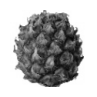

In [107]:
draw_fruits(fruits[100:101])

- k-평균 알고리즘은 **반복적으로 클러스터 중심을 옮기면서 최적의 클러스터를 찾음**
- 알고리즘이 반복한 횟수는 `KMeans` 클래스의 `n_iter_`속성에 저장

In [108]:
print(km.n_iter_)

4


### 최적의 k 찾기
- k-평균 알고리즘의 단점 중 하나는 클러스터 개수를 사전에 지정해야 함
<br>

- **엘보우(elbow)** 방법: 적절한 클러스터 개수를 찾기 위한 대표적인 방법
- **이너셔(inertia)**: 클러스터 중심과 클러스터에 속한 샘플 사이의 거리의 제곱의 합  
    이너셔는 **클러스터에 속한 샘플이 얼마나 가깝게 모여 있는지를 나타내는 값**  
    일반적으로 클러스터 개수가 늘어나면 클러스터 개개의 크기는 줄어들기 때문에 이너셔도 줄어듦  
    -> 엘보우 방법은 **클러스터 개수를 늘려가며 이너셔의 변화를 관찰**하여 최적의 클러스터 개수를 찾는 방법  
<br>

- 클러스터 개수를 증가시키면서 이너셔를 그래프로 그리면 감소하는 속도가 꺾이는 지점이 있음  
    이 지점부터는 클러스터 개수를 늘려도 클러스터에 잘 밀집된 정도가 크게 개선되지 않음  
    -> 즉, 이너셔가 크게 줄어들지 않음 (이 지점이 마치 팔꿈치 모양이어서 엘보우 방법이라 칭함)
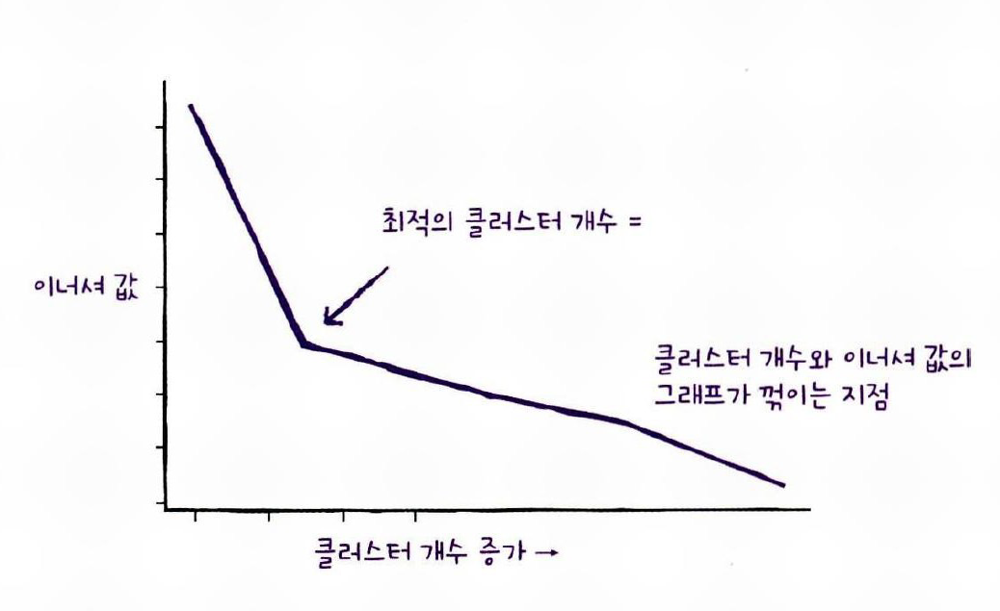
<br>

- `KMeans` 클래스는 자동으로 이너셔를 계산하여 `inertia_`속성으로 제공


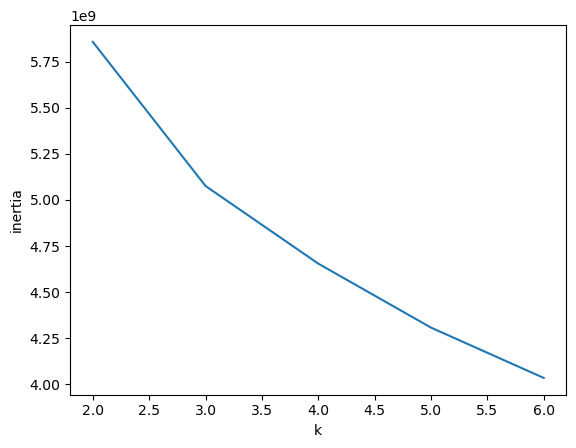

In [109]:
#클러스터 개수k를 2~6까지 바꿔가며 KMeans 클래스를 5번 훈련
#fit() 메서드로 모델을 훈련한 후 inertia_ 속성에 저장된 이너셔 값을 inertia 리스트에 추가
#마지막으로 inertia 리스트에 저장된 값을 그래프로 출력
inertia = []
for k in range(2, 7):
    km = KMeans(n_clusters=k, n_init='auto', random_state=42)
    km.fit(fruits_2d)
    inertia.append(km.inertia_)
plt.plot(range(2, 7), inertia)
plt.xlabel('k')
plt.ylabel('inertia')
plt.show()

- 위 그래프에서 꺾이는 지점이 두드러지지는 않지만, k=3에서 그래프의 기울기가 조금 바뀐 것을 볼 수 있음
- 엘보우 지점보다 클러스터 개수가 많아지면 이너셔의 변화가 줄어들면서 군집 효과도 줄어듦

## 06-3. 주성분 분석
Keyword: `차원 축소`, `주성분 분석`, `설명된 분석`
<br>

### 차원과 차원 축소
- **특성**: 데이터가 가진 속성
- 과일 사진의 경우 10,000개의 픽셀이 있기 때문에 10,000개의 특성
- 머신러닝에서는 이런 특성을 **차원(dimension)**이라고 부름
- 10,000개의 특성 = 10,000개의 차원
    - 이 차원을 줄일 수 있다면 저장 공간을 절약할 수 있음
<br>

- '2차원 배열', '1차원 배열'에서의 차원과 다른 건가요?
    - 배열과 벡터에서 차원이란 용어는 다르게 사용됨  
    - 다차원 배열에서 차원은 배열의 축 개수가 됨
    - 가령 2차원 배열일 때는 행과 열이 차원이 됨
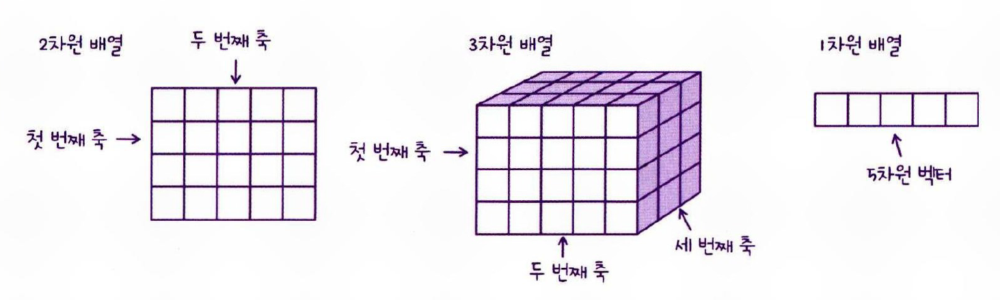
<br>

- **차원 축소(dimensionality reduction)** 알고리즘  
    - 데이터를 가장 잘 나타내는 일부 특성을 선택하여 데이터 크기를 줄이고 지도 모델의 성능을 향상시킬 수 있는 방법  
    - 줄어든 차원에서 다시 원본 차원으로 손실을 최대한 줄이면서 복원할 수 있음
    - 예) 주성분 분석(pricipal component analysis, PCA)
<br>

### 주성분 분석 소개
- **주성분 분석**은 데이터에 있는 분산이 큰 방향을 찾는 것으로 이해 가능
- **분산**은 데이터가 널리 퍼져있는 정도
- 분산이 큰 방향이란 데이터를 잘 표현하는 어떤 벡터라고 생각할 수 있음
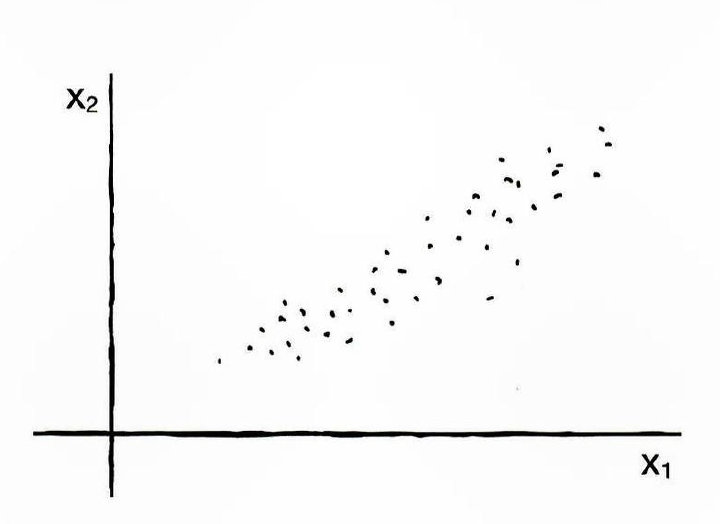
- 이 데이터는 x1, x2 2개의 특성이 있고, 대각선 방향으로 길게 늘어진 형태
- 이 데이터에서 가장 분산이 큰 방향(데이터의 분포를 가장 잘 표현하는 방향)을 찾아보기
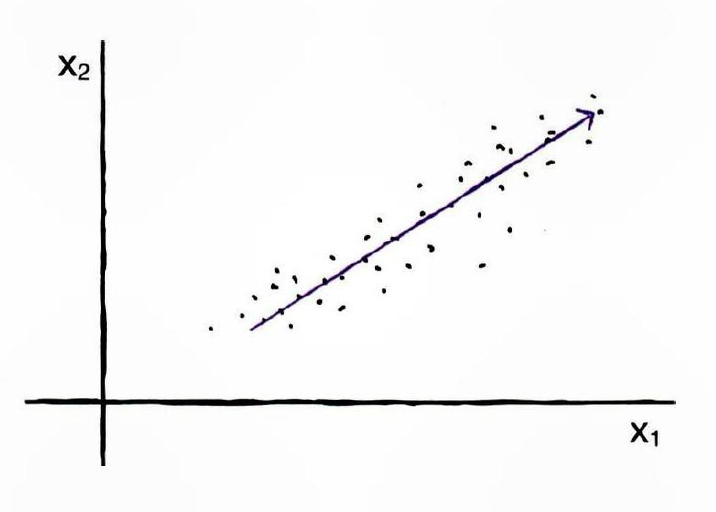
- 그림을 통해서 길게 늘어진 대각선 방향이 분산이 가장 크다는 것을 알 수 있음
- 화살표 위치는 큰 의미가 없음. 중요한 것은 **분산이 큰 방향**을 찾는 것
<br>

- 앞에서 찾은 직선이 원점에서 출발한다면 두 원소로 이루어진 벡터로 쓸 수 있음
- 예를 들어 아래 그림의 (2,1)처럼 나타낼 수 있음
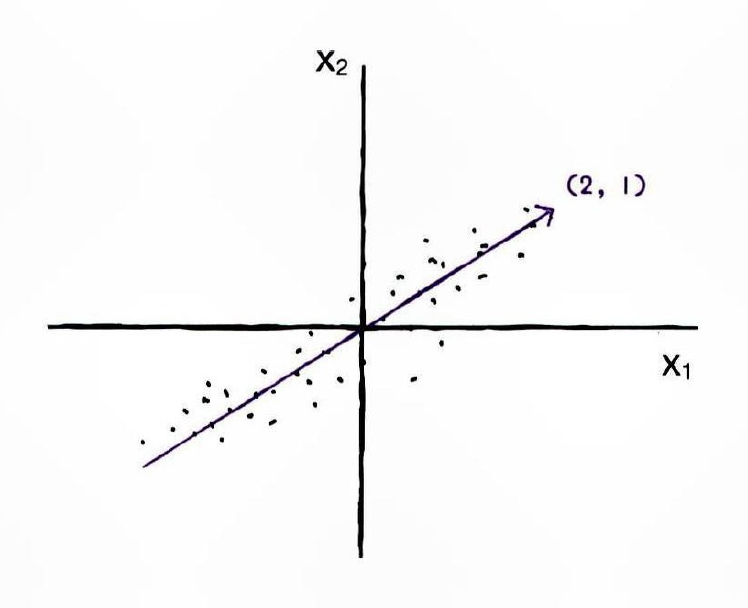
- 실제로 사이킷런의 PCA 모델을 훈련하면 자동으로 특성마다 평균값을 빼서 원점에 맞춰 줌 (수동으로 맞출 필요 없음)
- 이 벡터를 **주성분(principal component)**이라고 부름 - 원본 데이터에 있는 어떤 방향
- 주성분 벡터의 **원소의 개수**는 원본 데이터셋에 있는 **특성 개수**와 같음
- 주성분을 사용해 원본 데이터의 차원을 줄일 수 있음
- 예를 들어 샘플 데이터 s(2, 4)를 주성분에 직각으로 투영하면 1차원 데이터 p(3.58)를 만들 수 있음
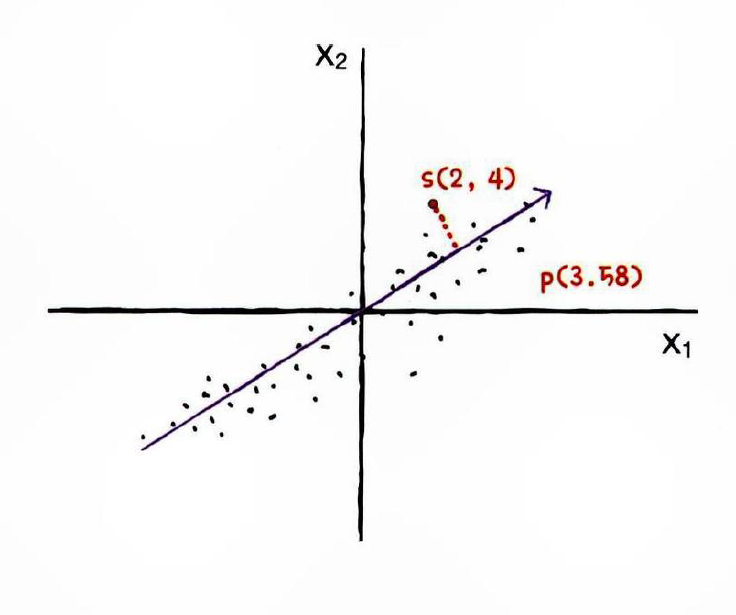
- **주성분은 원본 차원과 같고 주성분으로 바꾼 데이터는 차원이 줄어듦**
- 주성분이 **가장 분산이 큰 방향**이기 때문에 주성분에 투영하여 바꾼 데이터는 원본이 가지고 있는 특성을 가장 잘 나타내고 있을것
- 첫 번재 주성분을 찾은 다음 이 벡터에 수직이고 분산이 가장 큰 다음 방향을 찾음 - 두 번째 주성분
- 예시 그림은 2차원이기 때문에 두 번째 주성분의 방향은 다음처럼 하나뿐
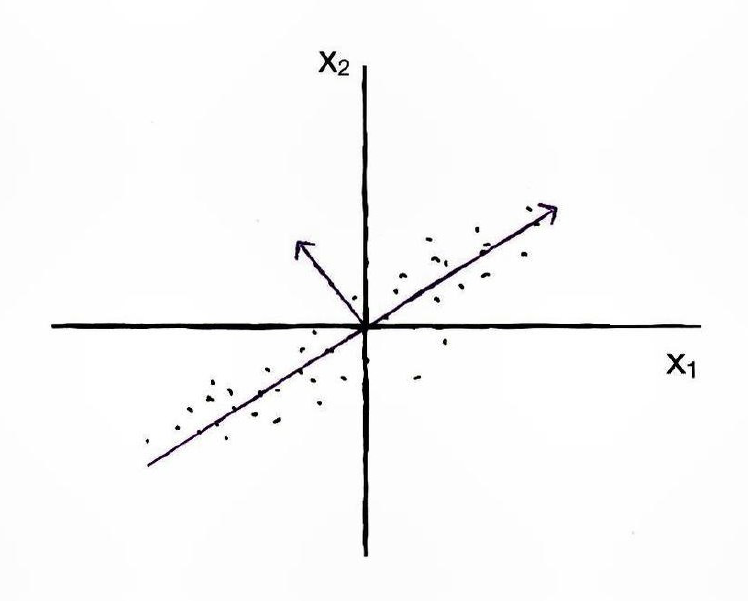
- 일반적으로 주성분은 원본 특성의 개수만큼 찾을 수 있음


### PCA 클래스

In [110]:
#과일 사진 데이터를 다운로드하여 넘파이 배열로 적재
!wget http://bit.ly/fruits_300_data -O fruits_300.npy
import numpy as np
fruits = np.load('fruits_300.npy')
fruits_2d = fruits.reshape(-1, 100*100)

--2025-11-11 15:42:42--  http://bit.ly/fruits_300_data
Resolving bit.ly (bit.ly)... 67.199.248.10, 67.199.248.11
Connecting to bit.ly (bit.ly)|67.199.248.10|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://github.com/rickiepark/hg-mldl/raw/master/fruits_300.npy [following]
--2025-11-11 15:42:43--  https://github.com/rickiepark/hg-mldl/raw/master/fruits_300.npy
Resolving github.com (github.com)... 20.200.245.247
Connecting to github.com (github.com)|20.200.245.247|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/rickiepark/hg-mldl/master/fruits_300.npy [following]
--2025-11-11 15:42:43--  https://raw.githubusercontent.com/rickiepark/hg-mldl/master/fruits_300.npy
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.110.133, 185.199.108.133, 185.199.111.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.110.133|:443... con

In [111]:
#사이킷런은 sklearn.decomposition 모듈 아래 PCA 클래스로 주성분 분석 알고리즘을 제공
#PCA 클래스의 객체를 만들 때 n_components 매개변수에 주성분 개수를 지정해야 함
#k-평균과 마찬가지로 비지도 학습이기 때문에 fit() 메서드에 타깃값을 제공하지 않음
from sklearn.decomposition import PCA
pca = PCA(n_components=50)
pca.fit(fruits_2d)

,n_components,50
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [112]:
#PCA 클래스가 찾은 주성분은 components_ 속성에 저장
#배열의 크기 확인
print(pca.components_.shape)

(50, 10000)


- `n_components=50`으로 지정했기 때문에 `pca.components_`배열의 첫 번째 차원이 50  
    -> 50개의 주성분을 찾음
- 두 번째 차원은 항상 원본 데이터의 특성 개수와 같은 10,000
- 원본 데이터와 차원이 같으므로 주성분을 100X100 크기의 이미지처럼 출력 가능
- `draw_fruits()`함수를 사용하여 주성분을 그림화

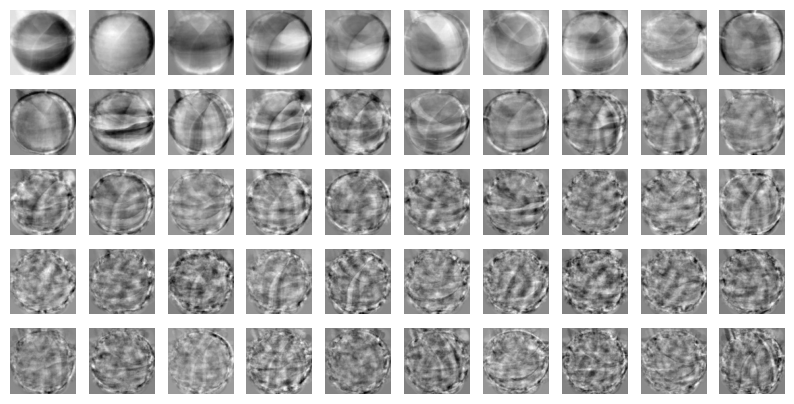

In [113]:
draw_fruits(pca.components_.reshape(-1, 100, 100))

- 이 주성분은 원본 데이터에서 가장 분산이 큰 방향을 순서대로 나타낸 것
<br>

- 주성분을 찾았으므로 원본 데이터를 주성분에 투영하여 특성의 개수를 10,000개에서 50개로 줄일 수 있음
- 원본 데이터를 각 주성분으로 분해하는 것
- PCA의 `transform()`메서드를 사용해 원본 데이터의 차원을 50으로 축소

In [114]:
print(fruits_2d.shape)

(300, 10000)


In [115]:
fruits_pca = pca.transform(fruits_2d)
print(fruits_pca.shape)

(300, 50)


- `fruits_2d`는 (300, 10000) 크기의 배열  
    -> 10,000개의 픽셀(특성)을 가진 300개의 이미지  
- 50개의 주성분을 찾은 PCA 모델을 사용해 이를 (300, 50) 크기의 배열로 변환
- `fruits_pca` 배열은 50개의 특성을 가진 데이터
- **주성분 분석은 데이터 변환이 목적이므로 predict() 메서드를 제공하지 않음**


### 원본 데이터 재구성
- `PCA` 클래스는 이를 위해 `inverse_transform()` 메서드를 제공
- 앞서 50개의 차원으로 축소한 `fruits_pca` 데이터를 전달해 10,000개의 특성을 복원

In [116]:
#축소한 차원(특성) 복원
fruits_inverse = pca.inverse_transform(fruits_pca)
print(fruits_inverse.shape)

(300, 10000)


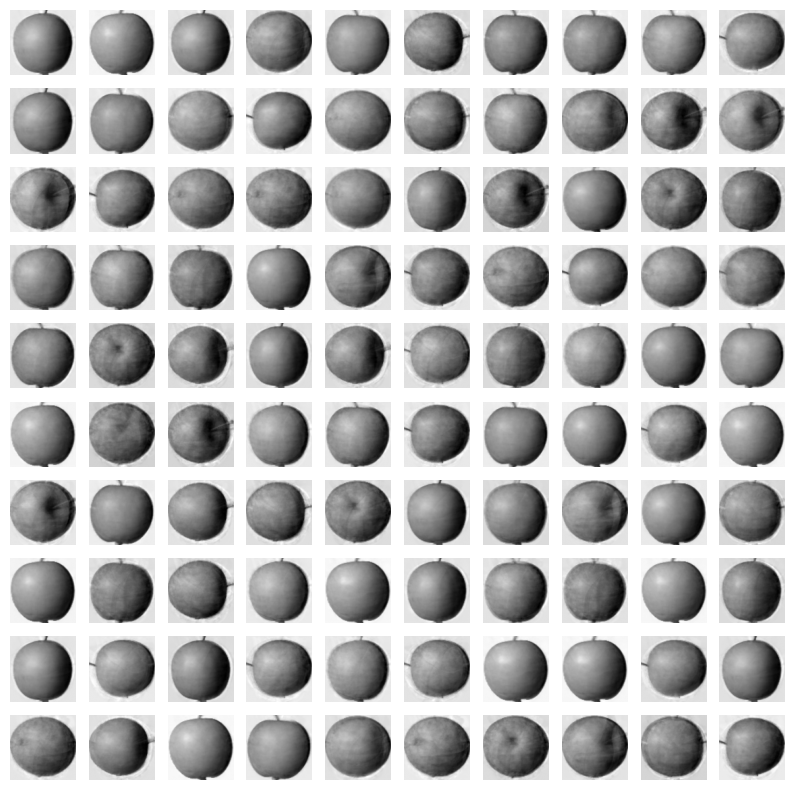

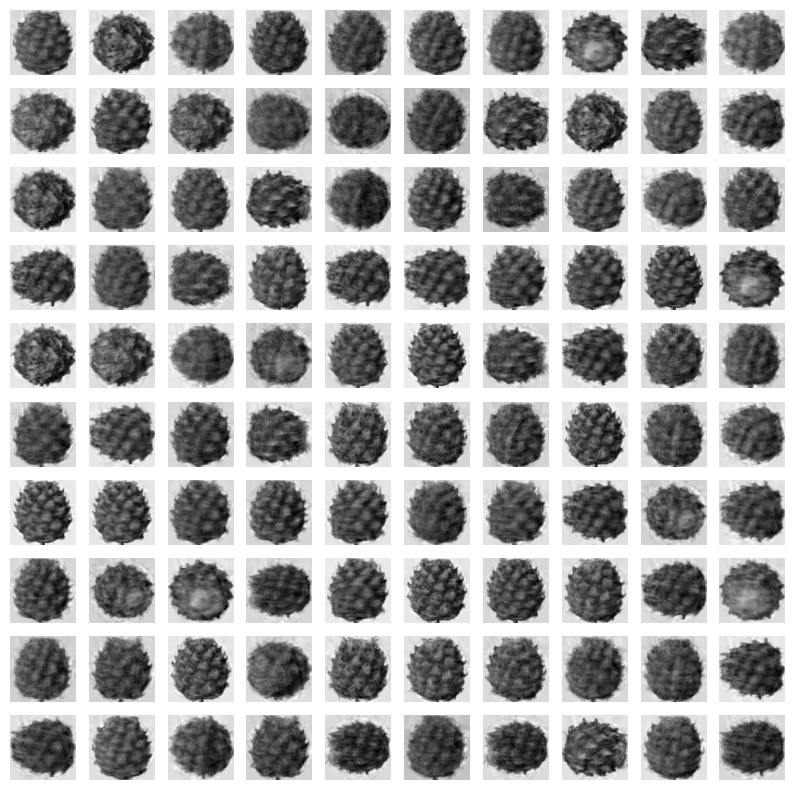

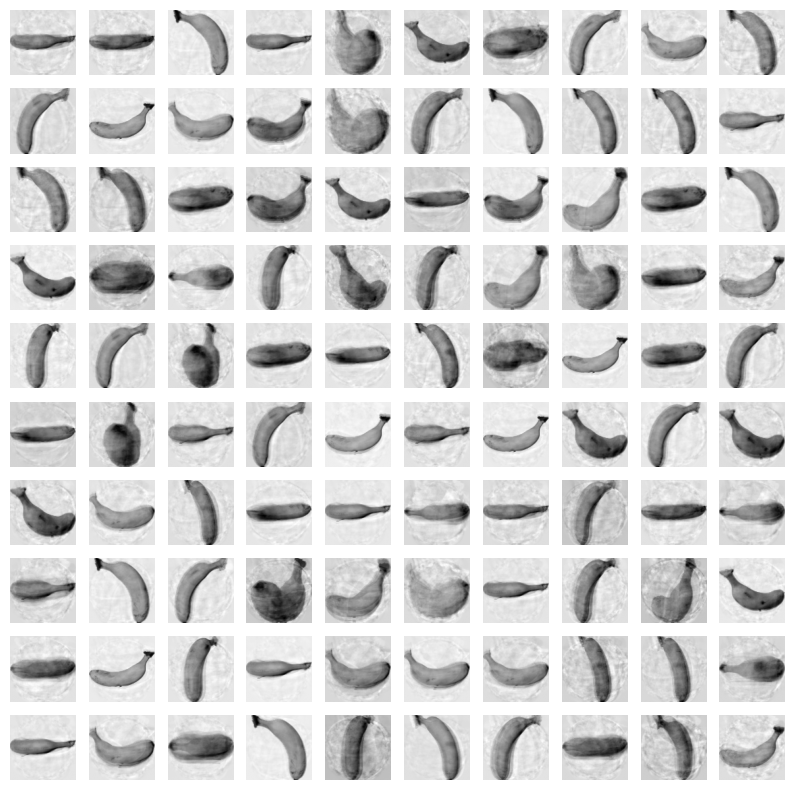

In [117]:
#복원한 특성을 100x100 크기로 바꾸어 100개씩 나누어 출력
#사과, 파인애플, 바나나를 100개씩 담고 있음
fruits_reconstruct = fruits_inverse.reshape(-1, 100, 100)
for start in [0, 100, 200]:
    draw_fruits(fruits_reconstruct[start:start+100])
    print("\n")

### 설명된 분산
- **설명된 분산(explained variance)**: 주성분이 원본 데이터의 분산을 얼마나 잘 나타내는지 기록한 값
- PCA 클래스의 explained_variance_ratio_에 각 주성분의 설명된 분산 비율이 기록되어 있음
- 첫 번째 주성분의 설명된 분산이 가장 큼
- 분산 비율을 모두 더하면 50개의 주성분으로 표현하고 있는 **총 분산 비율**을 얻을 수 있음

In [118]:
print(np.sum(pca.explained_variance_ratio_))

0.9215527501544517


- 92%가 넘는 분산 유지  
    - 앞에서 50개의 특성에서 원본 데이터를 복원했을 때 원본 이미지 품질이 높았던 이유
- 설명된 분산의 비율을 그래프로 그려보면 적절한 주성분의 개수를 찾는데 도움이 됨
- 맷플롯립의 `plot()`함수로 설명된 분산을 그래프로 출력

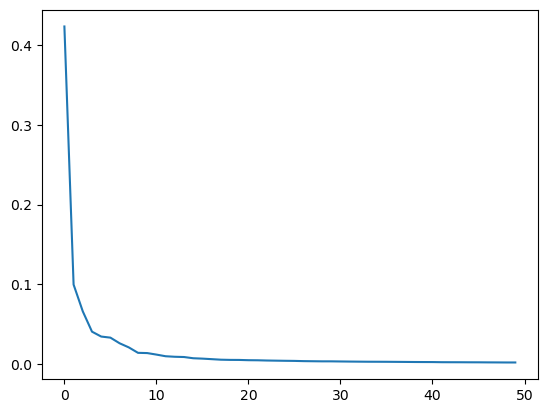

In [119]:
#맷플롯립의 plot()함수로 설명된 분산을 그래프로 출력
plt.plot(pca.explained_variance_ratio_)
plt.show()

- 그래프를 통해 처음 10개의 주성분이 대부분의 분산을 표현하고 있음을 확인  
    그 다음부터는 각 주성분이 설명하고 있는 분산은 비교적 작음
- PCA로 차원 축소된 데이터를 사용하여 지도 학습 모델을 훈련
<br>

### 다른 알고리즘과 함께 사용하기
- 로지스틱 회귀 모델을 이용하여 3개의 과일 사진 분류

In [120]:
#사이킷런의 LogisticRegression 모델 생성
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()

In [121]:
#지도 학습 모델 사용을 위해 사과 = 0, 파인애플 = 1, 바나나 = 2로 타깃값 설정
#파이썬 리스트와 정수를 곱하면 리스트 안의 원소를 정수만큼 반복
target = np.array([0]*100 + [1]*100 + [2]*100)

In [122]:
#원본 데이터인 fruits_2d를 먼저 사용
#로지스틱 회귀 모델의 성능 체크를 위해 cross_validate()로 교차 검증 수행
from sklearn.model_selection import cross_validate
scores = cross_validate(lr, fruits_2d, target)
print(np.mean(scores['test_score']))
print(np.mean(scores['fit_time']))

0.9966666666666667
0.09271731376647949


> 교차 검증의 점수는 0.997 정도로 매우 높음  
> 특성이 10,000개나 되기 때문에 300개의 샘플에서는 금방 과대적합된 모델을 만들기 쉬움  
> `cross_validate()`함수가 반환하는 딕셔너리에는 `fit_time`항목에 각 교차 검증 폴드의 훈련시간이 기록  
> 이 값을 PCA로 축소한 fruits_pca를 사용했을 때와 비교

In [123]:
scores = cross_validate(lr, fruits_pca, target)
print(np.mean(scores['test_score']))
print(np.mean(scores['fit_time']))

0.9966666666666667
0.007607507705688477


> PCA 클래스를 사용할 때 `n_components` 매개변수에 주성분의 개수를 지정  
> 원하는 설명된 분산의 비율을 입력 가능  
> PCA 클래스는 지정된 비율에 도달할 때까지 자동으로 주성분 검색  

In [125]:
#설명된 분산의 50%에 달하는 주성분을 찾도록 PCA 모델 생성
#주성분의 개수 대신 0~1사이의 비율을 실수로 입력
pca = PCA(n_components=0.5)
pca.fit(fruits_2d)

,n_components,0.5
,copy,True
,whiten,False
,svd_solver,'auto'
,tol,0.0
,iterated_power,'auto'
,n_oversamples,10
,power_iteration_normalizer,'auto'
,random_state,None


In [126]:
#주성분 개수 확인
print(pca.n_components_)

2


> 2개의 특성만으로 원본 데이터에 있는 분산의 50%를 표현 가능
<br>

- 이 모델로 원본 데이터를 변환
    - 주성분이 2개이므로 변환된 데이터의 크기는 (300, 2)


In [127]:
fruits_pca = pca.transform(fruits_2d)
print(fruits_pca.shape)

(300, 2)


In [128]:
#2개의 특성을 사용한 뒤 교차 검증의 결과 확인
scores = cross_validate(lr, fruits_pca, target)
print(np.mean(scores['test_score']))
print(np.mean(scores['fit_time']))

0.99
0.011169767379760743


/home/hagyeong/miniconda3/envs/ai-study/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/home/hagyeong/miniconda3/envs/ai-study/lib/python3.10/site-packages/sklearn/linear_model/_logistic.py:473: ConvergenceWarning: lbfgs failed to converge after 100 iteration(s) (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT

Increase the number of iterations to improve the convergence (max_iter=100).
You might also want to scale the data as shown in:
    https://scikit-learn.

> 2개의 특성을 사용해도 99%의 정확도 달성

- 차원 축소된 데이터를 사용해 k-평균 알고리즘으로 클러스터 확인

In [129]:
from sklearn.cluster import KMeans
km = KMeans(n_clusters=3, random_state=42)
km.fit(fruits_pca)
print(np.unique(km.labels_, return_counts=True))

(array([0, 1, 2], dtype=int32), array([110,  99,  91]))


> `fruits_pca`로 찾은 클러스터는 각각 110개, 99개, 91개의 샘플을 포함  
>  2절에서 원본 데이터를 사용했을 때와 거의 비슷한 결과

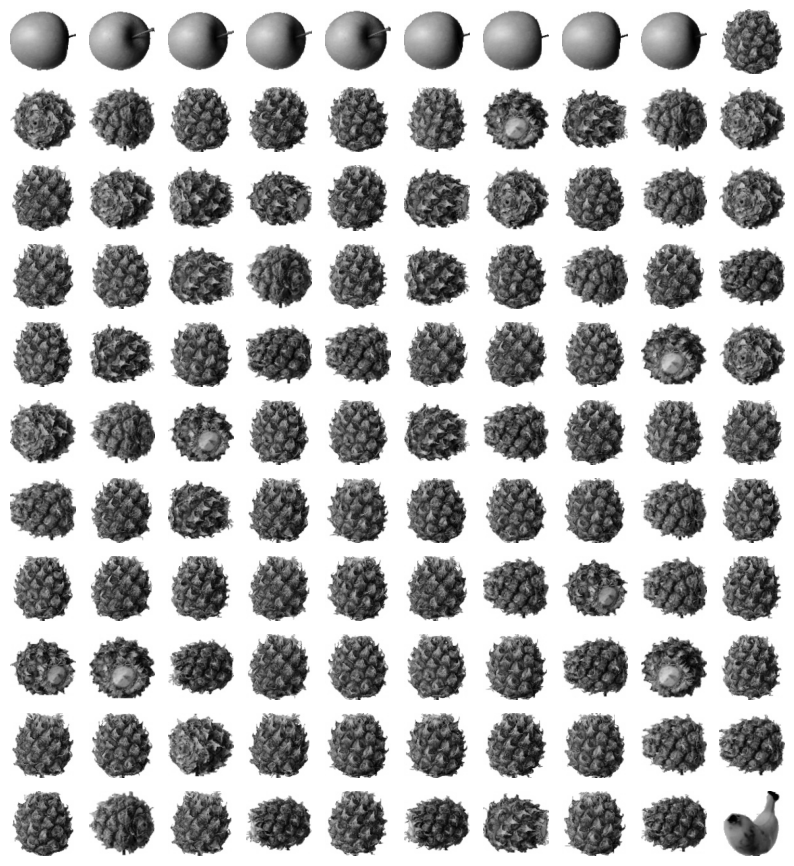

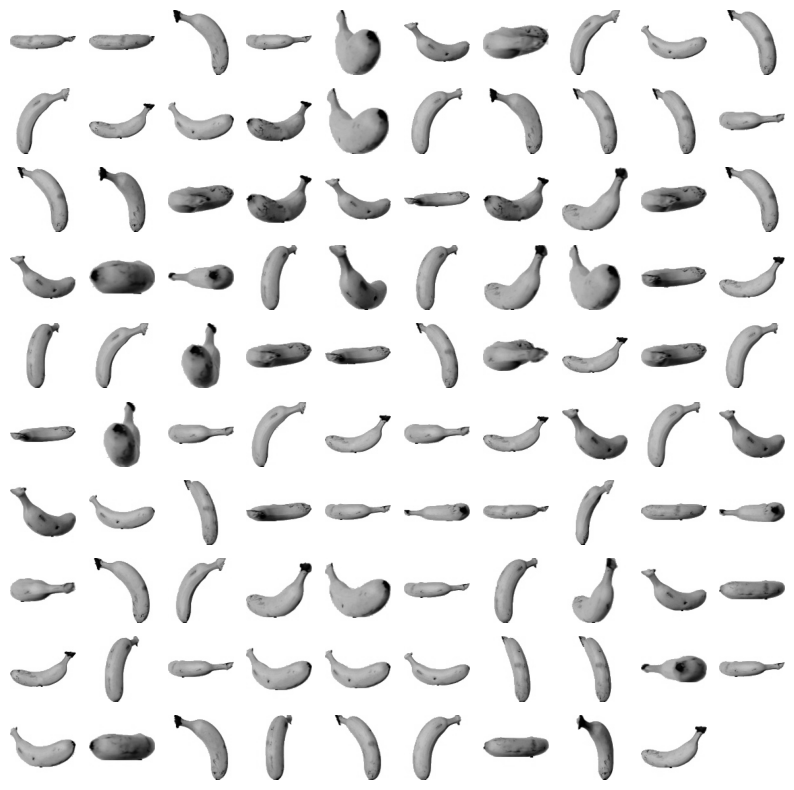

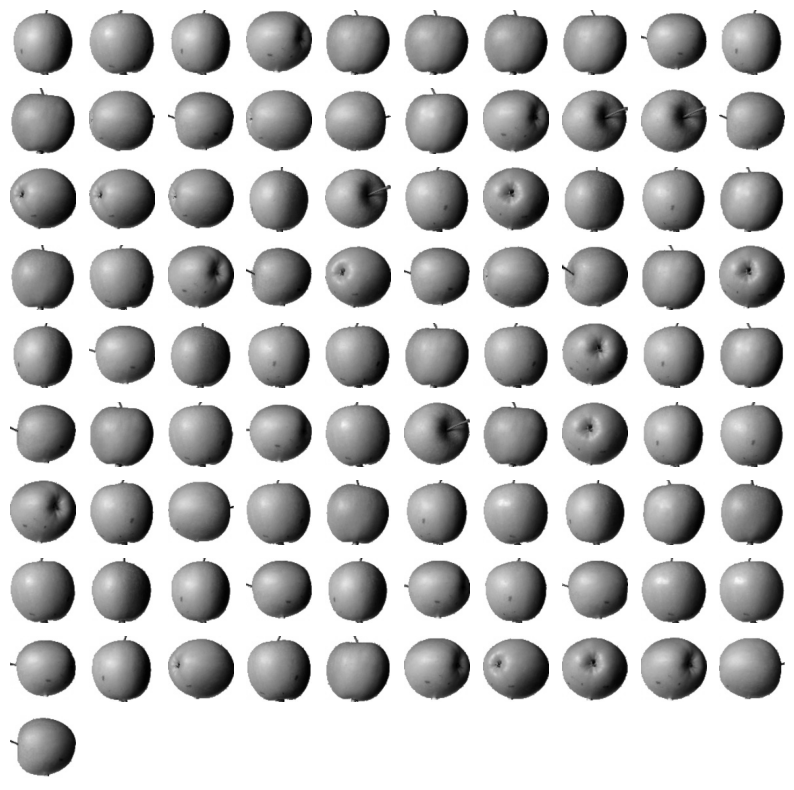

In [130]:
#KMeans가 찾은 레이블을 사용해 과일 이미지를 출력
for label in range(0, 3):
    draw_fruits(fruits[km.labels_ == label])
    print("\n")

> 2절에서 찾은 클러스터와 비슷하게 파인애플은 사과와 조금 혼동되는 면이 있음
> 몇 개의 사과가 파인애플 클러스터에 섞여 있음
<br>

- 훈련 데이터의 차원을 줄였을 때 또다른 장점 = **시각화**
    - 3개 이하로 차원을 줄이면 화면에 출력하기 비교적 쉬움
- `fruits_pca`데이터는 2개의 특성이 있기 때문에 2차원으로 표현 가능

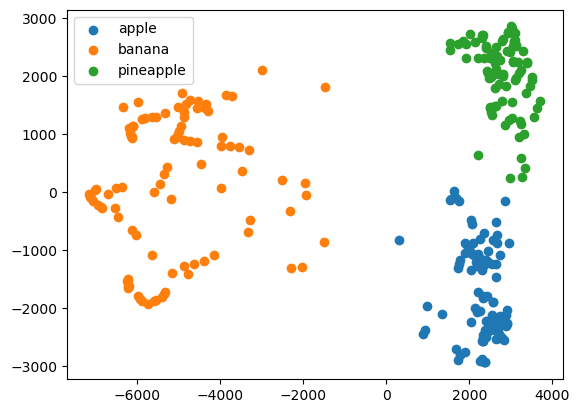

In [131]:
#km.labels_를 사용해 클러스터별로 나누어 산점도 생성
for label in range(0, 3):
    data = fruits_pca[km.labels_ == label]
    plt.scatter(data[:,0], data[:,1])
plt.legend(['apple', 'banana', 'pineapple'])
plt.show()

> 각 클러스터의 산점도가 잘 구분되어있음
> 산점도에서 사과와 파인애플의 클러스터의 경계가 가까운 것으로 보아 두 클러스터의 샘플 몇 개는 혼동을 일으키기 쉬움